In [2]:
import numpy as np
from six.moves import cPickle as pickle
from scipy import misc
import scipy.io as sio
import h5py
import matplotlib.pyplot as plt
import tensorflow as tf
import math
import random
import os
%matplotlib inline
print "Done"

Done


In [3]:
folder1="train"
raw_training_data = sio.loadmat(folder1 + "_data")[folder1 + '_dataset']

folder2="extra"
raw_extra_data = sio.loadmat(folder2 + "_data")[folder2 + '_dataset']
print "Done"

Done


In [4]:
train_image_names, train_labels, train_bboxes, train_n_bboxes = raw_training_data['names'], raw_training_data['labels'], raw_training_data['bbox'], raw_training_data['length']
print train_image_names.shape
print train_labels.shape
print train_bboxes.shape
print train_n_bboxes.shape
TRAIN_DATASET_SIZE=train_labels.shape[1]

extra_image_names, extra_labels, extra_bboxes, extra_n_bboxes = raw_extra_data['names'], raw_extra_data['labels'], raw_extra_data['bbox'], raw_extra_data['length']
print extra_image_names.shape
print extra_labels.shape
print extra_bboxes.shape
print extra_n_bboxes.shape

(1, 33402)
(1, 33402)
(1, 33402)
(1, 33402)
(1, 80000)
(1, 80000)
(1, 80000)
(1, 80000)


In [5]:
train_image_names = train_image_names.reshape(train_image_names.shape[1])
train_labels = train_labels.reshape(train_labels.shape[1])
train_bboxes = train_bboxes.reshape(train_bboxes.shape[1])
train_n_bboxes = train_n_bboxes.reshape(train_n_bboxes.shape[1])

train_image_names = [item for sublist in train_image_names for item in sublist]
train_labels = [item for sublist in train_labels for item in sublist]
train_bboxes = [item for sublist in train_bboxes for item in sublist]
train_n_bboxes = [item for sublist in train_n_bboxes for item in sublist]

print "Done"

Done


In [6]:
extra_image_names = extra_image_names.reshape(extra_image_names.shape[1])
extra_labels = extra_labels.reshape(extra_labels.shape[1])
extra_bboxes = extra_bboxes.reshape(extra_bboxes.shape[1])
extra_n_bboxes = extra_n_bboxes.reshape(extra_n_bboxes.shape[1])

extra_image_names = [item for sublist in extra_image_names for item in sublist]
extra_labels = [item for sublist in extra_labels for item in sublist]
extra_bboxes = [item for sublist in extra_bboxes for item in sublist]
extra_n_bboxes = [item for sublist in extra_n_bboxes for item in sublist]

print "Done"

Done


In [7]:
train_image_names = np.append(train_image_names, extra_image_names)
train_labels = np.append(train_labels, extra_labels)
train_bboxes = np.append(train_bboxes, extra_bboxes, axis=0)
train_n_bboxes = np.append(train_n_bboxes, extra_n_bboxes)

In [8]:
print train_image_names.shape
print train_labels.shape
print train_bboxes.shape
print train_n_bboxes.shape

(113402,)
(113402,)
(113402, 4)
(113402,)


[1, 9]
[1, 6, 9]


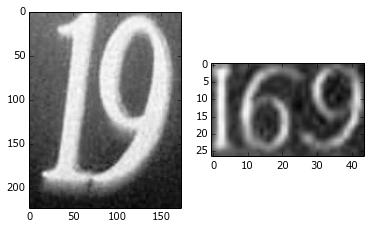

In [9]:
f, (ax1, ax2) = plt.subplots(1, 2)

# display the first and the last image and labels for the training dataset
img = misc.imread("./" + folder1 + "/" + str(train_image_names[0]), flatten=True)
aa, bb, cc, dd =  map(int, train_bboxes[0])
img = img[aa:bb, cc:dd]
ax1.imshow(img, cmap=plt.cm.Greys)
print list(train_labels[0])

id = 33401
img = misc.imread("./" + folder1 + "/" + str(train_image_names[id]), flatten=True)
aa, bb, cc, dd =  map(int, train_bboxes[id])
img = img[aa:bb, cc:dd]
ax2.imshow(img, cmap=plt.cm.Greys)
print list(train_labels[id])

[4, 7, 8]
[3, 3]


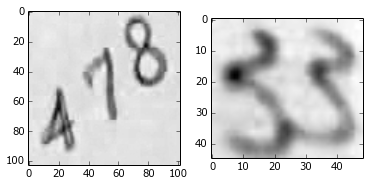

In [10]:
# display first and last image of the extra dataset
f, (ax1, ax2) = plt.subplots(1, 2)

id = 33402
# display the first and the last image and labels for the training dataset
img = misc.imread("./" + folder2 + "/" + str(train_image_names[id]), flatten=True)
aa, bb, cc, dd = map(int, train_bboxes[id])
img = img[aa:bb, cc:dd]
ax1.imshow(img, cmap=plt.cm.Greys)
print list(train_labels[id])

id = 113401
img = misc.imread("./" + folder2 + "/" + str(train_image_names[id]), flatten=True)
aa, bb, cc, dd = map(int, train_bboxes[id])
img = img[aa:bb, cc:dd]
ax2.imshow(img, cmap=plt.cm.Greys)
print list(train_labels[id])

In [11]:
print TRAIN_DATASET_SIZE

33402


In [12]:
IMAGE_SIZE=56
N_CHANNELS=1
DATASET_SIZE = 100000
MAX_NUMBER_OF_LABELS=5
PIXEL_DEPTH=255.0
VALIDATION_DATASET_SIZE=500
TEST_DATASET_SIZE=500

In [13]:
def display_images_at_random(dataset, labels):
    # random.seed(1)
    
    f, axarr = plt.subplots(4, 3, figsize=(11,15))
    
    for i in range(4):
        for j in range(3):
            img_rand_index = random.randrange(0,dataset.shape[0])
            axarr[i, j].imshow(dataset[img_rand_index].reshape(IMAGE_SIZE,IMAGE_SIZE), cmap=plt.cm.Greys);
            axarr[i, j].set_title('Label: ' + str(labels[img_rand_index]) + "Id: " + str(img_rand_index))

    plt.show()

In [14]:
dataset_id = 0
dataset = np.zeros(shape=(DATASET_SIZE, IMAGE_SIZE, IMAGE_SIZE, N_CHANNELS), dtype=np.float32)
labels = np.zeros(shape=(DATASET_SIZE, MAX_NUMBER_OF_LABELS), dtype=np.int8)
n_bboxes = []
selected_images = []

for img_id in range(0,len(train_labels)):

    discard = False
    is_resized = False

    if (img_id < TRAIN_DATASET_SIZE):
        current_folder = folder1 # get from the extra dataset
        print "Using:", folder1
    else:
        current_folder = folder2
        print "Using:", folder2

    # get the image file name
    img_name = train_image_names[img_id]
    img_labels = list(train_labels[img_id])
    img_bboxes_number = train_n_bboxes[img_id]

    # if the image has more than digits, discard it
    if len(img_labels) > MAX_NUMBER_OF_LABELS:
        print "Discarding image:", img_name, "\tMore than:", MAX_NUMBER_OF_LABELS, "digits."
        continue
    
    # read the image from disk
    try:
        img = misc.imread("./" + current_folder + "/" + img_name, flatten=True)
         
    except IOError as e:
        print("Oops! Problem reading that image, lets skip it.")
        continue
        
    print "Processing image:", img_name, "\tOriginal shape:", img.shape

    # read the bbox data
    aa, bb, cc, dd = map(int, train_bboxes[img_id])

    # crop the images to the bboxes
    img = img[aa:bb, cc:dd]   
        
    # get the new image size
    img_h = img.shape[0]
    img_w = img.shape[1]

    # skip too large images
    if (img_h > 4 * IMAGE_SIZE) or (img_w > 6 * IMAGE_SIZE):
        print "Skipping image:", img_name, "\tShape rejected:", img_h, img_w
        continue

    # if the image is greater than IMAGE_SIZE, slowly resize it
    # until it fits the size
    if img_h > IMAGE_SIZE or img_w > IMAGE_SIZE:
        if img_w >= img_h:
            target_width = IMAGE_SIZE
            target_height = int(round((img_h * IMAGE_SIZE) / float(img_w)))
        else:
            target_height = IMAGE_SIZE
            target_width = int(round((img_w * IMAGE_SIZE) / float(img_h)))

        if (target_width < 10 or target_height < 10):
            print "--- Discarding image", img_name, "\nShape:",target_height, target_width, "---"
            continue

        img = misc.imresize(img,(target_height, target_width))
        is_resized = True

    if is_resized == True:
        print "Resizing image", img_name, "\nNew shape:",target_height, target_width

    # get the new image size
    img_h = img.shape[0]
    img_w = img.shape[1]
    # put the image to the defined size
    if img_h < IMAGE_SIZE:
        top_padding = (IMAGE_SIZE-img_h)/2
        bottom_padding = IMAGE_SIZE-img_h - top_padding
        img = np.pad(img, ((top_padding,bottom_padding),(0,0)), "constant")

    if img_w < IMAGE_SIZE:
        top_padding = (IMAGE_SIZE-img_w)/2
        bottom_padding = IMAGE_SIZE-img_w - top_padding
        img = np.pad(img, ((0,0),(top_padding,bottom_padding)), "constant")
    
    # TODO: normalize the image
    img = (img - (PIXEL_DEPTH / 2.0)) / PIXEL_DEPTH
    dataset[dataset_id] = img.reshape(IMAGE_SIZE,IMAGE_SIZE,N_CHANNELS)

    # append -1 for images with less than MAX_NUMBER_OF_LABELS digits on it
    while len(img_labels) < MAX_NUMBER_OF_LABELS:
        img_labels = np.append(img_labels, -1)

    labels[dataset_id] = img_labels
    selected_images.append(img_name)
    n_bboxes.append(img_bboxes_number);

    
    if dataset_id==DATASET_SIZE:
        break
    
    dataset_id += 1

print "Done"

Using: train
Processing image: 1.png 	Original shape: (350, 741)
Resizing image 1.png 
New shape: 56 43
Using: train
Processing image: 2.png 	Original shape: (83, 199)
Using: train
Processing image: 3.png 	Original shape: (23, 52)
Using: train
Processing image: 4.png 	Original shape: (79, 161)
Using: train
Processing image: 5.png 	Original shape: (68, 140)
Using: train
Processing image: 6.png 	Original shape: (35, 74)
Using: train
Processing image: 7.png 	Original shape: (54, 99)
Using: train
Processing image: 8.png 	Original shape: (22, 54)
Using: train
Processing image: 9.png 	Original shape: (34, 79)
Using: train
Processing image: 10.png 	Original shape: (37, 74)
Using: train
Processing image: 11.png 	Original shape: (33, 63)
Using: train
Processing image: 12.png 	Original shape: (87, 171)
Using: train
Processing image: 13.png 	Original shape: (58, 128)
Using: train
Processing image: 14.png 	Original shape: (53, 112)
Using: train
Processing image: 15.png 	Original shape: (32, 66)
Us

IndexError: index 100000 is out of bounds for axis 0 with size 100000

[ 5  3 -1 -1 -1]
[ 2  2  0 -1 -1]


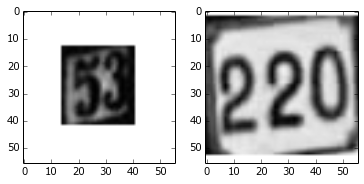

In [22]:
_, (ax1, ax2) = plt.subplots(1, 2)

id = 100
img = dataset[id,:,:]
ax1.imshow(img.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap=plt.cm.Greys);
print labels[id]

id = 33402
img = dataset[id,:,:]
ax2.imshow(img.reshape(IMAGE_SIZE,IMAGE_SIZE), cmap=plt.cm.Greys);
print labels[id]

In [23]:
print "New shape", dataset.shape
print "New Labels:", labels.shape

New shape (100000, 56, 56, 1)
New Labels: (100000, 5)


In [ ]:
id = 9999
img = dataset[id]
# print img
plt.imshow(img.reshape(img.shape[0], img.shape[1]), cmap=plt.cm.Greys)
print "# of digits:", n_bboxes[id]
print "Labels:", labels[id]

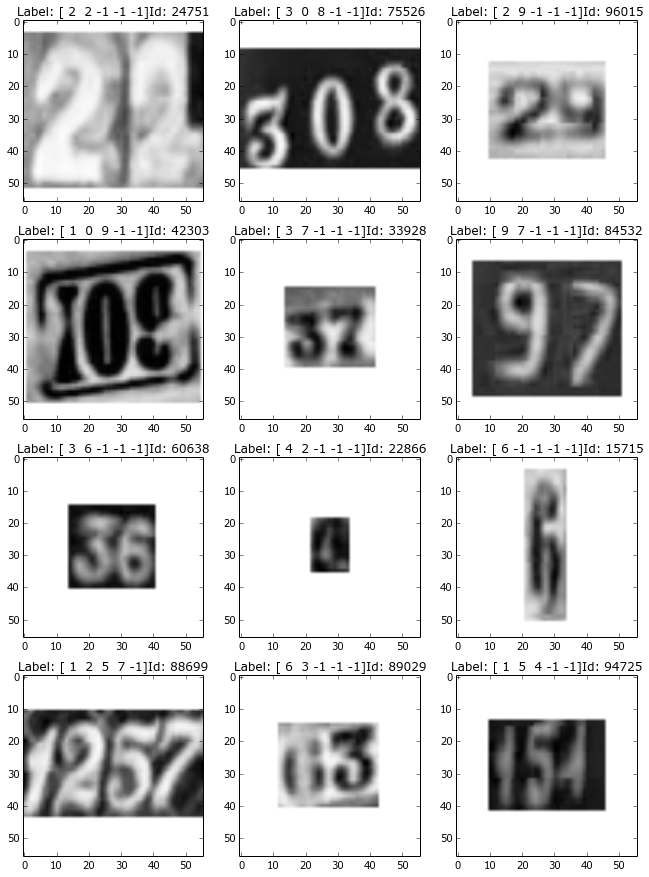

In [28]:
display_images_at_random(dataset, labels)

In [ ]:
# valid_dataset = dataset[:VALIDATION_DATASET_SIZE]
# valid_labels = labels[:VALIDATION_DATASET_SIZE]

# test_dataset = dataset[VALIDATION_DATASET_SIZE:TEST_DATASET_SIZE]
# test_labels = labels[VALIDATION_DATASET_SIZE:TEST_DATASET_SIZE]

# train_dataset = dataset[TEST_DATASET_SIZE:]
# train_labels = labels[TEST_DATASET_SIZE:]

In [ ]:
# print('Training set', train_dataset.shape, train_labels.shape)
# print('Validation set', valid_dataset.shape, valid_labels.shape)
# print('Test set', test_dataset.shape, test_labels.shape)

In [29]:

pickle_file = 'dataset.pickle'

try:
  f = open(pickle_file, 'wb')
  save = {
     'train_dataset': dataset,
     'train_labels': labels,
     'train_dataset_n_bboxes': n_bboxes,
#     'valid_labels': valid_labels,
#    'test_dataset': dataset,
#    'test_labels': labels,
    }
  pickle.dump(save, f, pickle.HIGHEST_PROTOCOL)
  f.close()
except Exception as e:
  print 'Unable to save data to', pickle_file, ':', e
  raise
print "Done"

Done


In [30]:
statinfo = os.stat(pickle_file)
print 'Compressed pickle size:', statinfo.st_size

Compressed pickle size: 1256299821
